In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import math

All_filename = "All.csv"  
df_all = pd.read_csv(All_filename)
Active_filename = "Active.csv"  
df_active = pd.read_csv(Active_filename)
Lazy_filename = "Lazy.csv"  
df_lazy = pd.read_csv(Lazy_filename)

## All data

In [23]:
df_all = df_all[df_all['Filename'] != 'CAMV100W.txt']
df_all.head()

,Filename,Rest Mean,Rest Std,Rest SD1,Rest SD2,Exercise Mean,Exercise Std,Exercise SD1,Exercise SD2,Recovery Mean,Recovery Std,Recovery SD1,Recovery SD2
0,hrrv100wD.txt,775.321149,49.318846,19.884154,66.812876,622.598753,24.365101,13.289446,31.804604,710.599526,54.438393,22.931997,73.520264
1,hrrv150wD.txt,880.489736,55.127078,27.946404,72.475058,657.493421,32.529406,17.763959,42.470314,791.543767,81.303204,38.228770,108.391939
2,hrrv200wD.txt,807.773585,48.884345,21.198706,65.724143,569.836502,25.347094,9.567952,34.567316,719.429257,74.891963,27.821784,102.272764
3,hrrv250wD.txt,822.875691,75.407134,30.912709,102.174187,540.288288,20.707133,10.106250,27.493486,758.587342,86.463744,30.523541,118.122605
4,hrrv300wD.txt,839.483146,77.580638,33.797283,104.383436,477.420382,9.563650,4.873274,12.625029,715.665072,70.410979,25.193996,96.456765


In [24]:
new_order = ['Filename',
             'Rest Mean','Rest Std',
             'Exercise Mean','Exercise Std',
             'Recovery Mean', 'Recovery Std',
             'Rest SD1', 'Rest SD2',
             'Exercise SD1','Exercise SD2',
             'Recovery SD1', 'Recovery SD2',
            ]  
df_all= df_all.reindex(columns=new_order)
df_all.head()

,Filename,Rest Mean,Rest Std,Exercise Mean,Exercise Std,Recovery Mean,Recovery Std,Rest SD1,Rest SD2,Exercise SD1,Exercise SD2,Recovery SD1,Recovery SD2
0,hrrv100wD.txt,775.321149,49.318846,622.598753,24.365101,710.599526,54.438393,19.884154,66.812876,13.289446,31.804604,22.931997,73.520264
1,hrrv150wD.txt,880.489736,55.127078,657.493421,32.529406,791.543767,81.303204,27.946404,72.475058,17.763959,42.470314,38.228770,108.391939
2,hrrv200wD.txt,807.773585,48.884345,569.836502,25.347094,719.429257,74.891963,21.198706,65.724143,9.567952,34.567316,27.821784,102.272764
3,hrrv250wD.txt,822.875691,75.407134,540.288288,20.707133,758.587342,86.463744,30.912709,102.174187,10.106250,27.493486,30.523541,118.122605
4,hrrv300wD.txt,839.483146,77.580638,477.420382,9.563650,715.665072,70.410979,33.797283,104.383436,4.873274,12.625029,25.193996,96.456765


In [25]:
df_all_dropped = df_all.drop(df_all.columns[0], axis=1)
df_all_dropped.head()

,Rest Mean,Rest Std,Exercise Mean,Exercise Std,Recovery Mean,Recovery Std,Rest SD1,Rest SD2,Exercise SD1,Exercise SD2,Recovery SD1,Recovery SD2
0,775.321149,49.318846,622.598753,24.365101,710.599526,54.438393,19.884154,66.812876,13.289446,31.804604,22.931997,73.520264
1,880.489736,55.127078,657.493421,32.529406,791.543767,81.303204,27.946404,72.475058,17.763959,42.470314,38.228770,108.391939
2,807.773585,48.884345,569.836502,25.347094,719.429257,74.891963,21.198706,65.724143,9.567952,34.567316,27.821784,102.272764
3,822.875691,75.407134,540.288288,20.707133,758.587342,86.463744,30.912709,102.174187,10.106250,27.493486,30.523541,118.122605
4,839.483146,77.580638,477.420382,9.563650,715.665072,70.410979,33.797283,104.383436,4.873274,12.625029,25.193996,96.456765


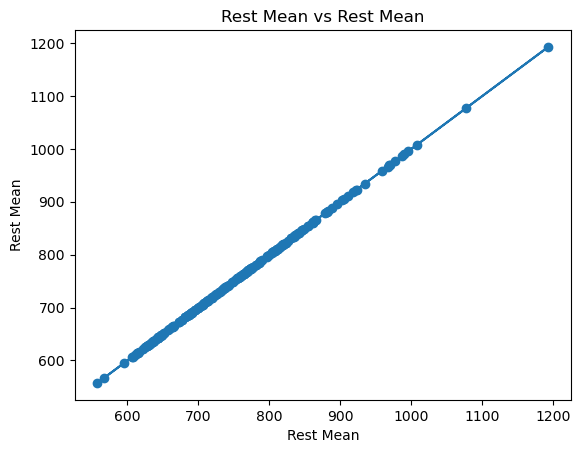

In [26]:
x_column = 'Rest Mean'
y_column = 'Rest Mean'

plt.plot(df_all[x_column], df_all[y_column], marker='o')

plt.xlabel(x_column)  
plt.ylabel(y_column)  
plt.title(f'{y_column} vs {x_column}')

plt.show()

In [14]:
import matplotlib.pyplot as plt
import math

def PLOTS(df):
    columns = df.columns
    num_columns = len(columns)
    num_plots = num_columns ** 2  
    cols = 3  
    rows = math.ceil(num_plots / cols)  
    fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 5)) 
    axes = axes.flatten()  
    plot_index = 0
    
    for i in range(num_columns):
        for j in range(num_columns):  
            x = df.iloc[:, i]
            y = df.iloc[:, j]
            x_label = columns[i]
            y_label = columns[j]
            
            axes[plot_index].plot(x, y, marker='o', linestyle='', color='blue')
            axes[plot_index].set_xlabel(x_label)
            axes[plot_index].set_ylabel(y_label)
            axes[plot_index].set_title(f'{y_label} vs {x_label}')
            
            plot_index += 1
    
    for idx in range(plot_index, len(axes)):
        fig.delaxes(axes[idx])  
    
    plt.tight_layout()
    plt.show()

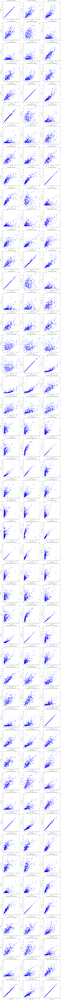

In [15]:
PLOTS(df_all_dropped)

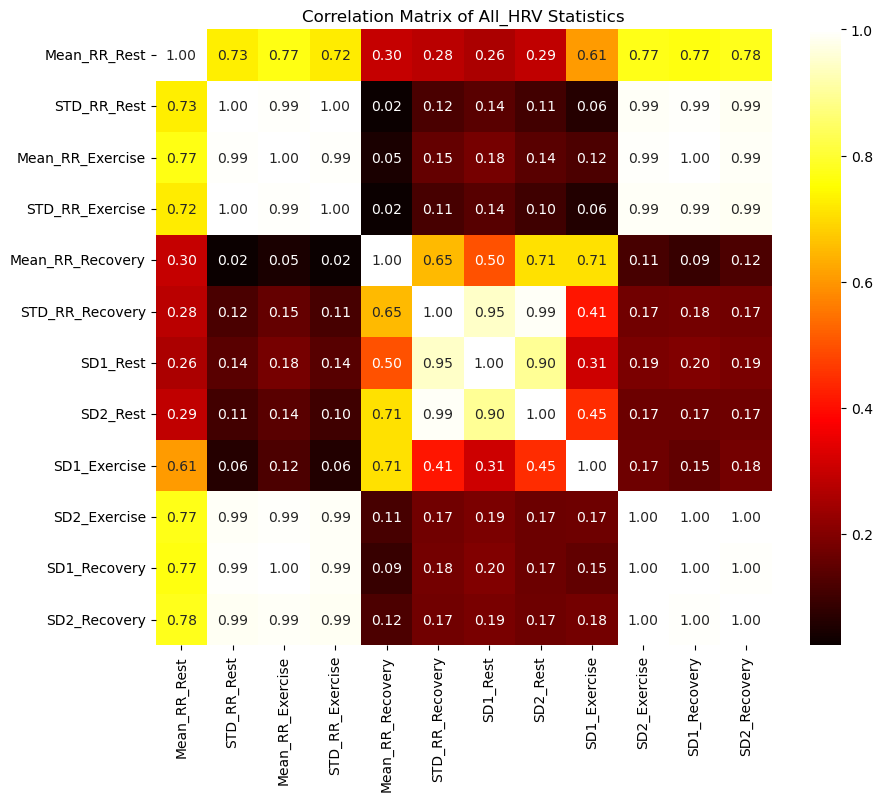

In [7]:
#sns.set(style='whitegrid')  
#pairplot = sns.pairplot(df_all_dropped, diag_kind='kde')  
#plt.title('Pairplot of All_HRV Statistics')
#plt.show()


correlation_matrix = df_all_dropped.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='hot', square=True, cbar=True)
plt.title('Correlation Matrix of All_HRV Statistics')
plt.show()

In [6]:
All_filename = "All.csv"  
df_all_2 = pd.read_csv(All_filename)
df_all_2 = df_all_2[df_all_2['Filename'] != 'CAMV100W.txt']
df_all_2['carga'] = df_all_2['Filename'].str.extract(r'(\d+)')


cols = df_all_2.columns.tolist()  # Get a list of column names
cols.insert(1, cols.pop(cols.index('carga')))  # Move 'carga' to the second position
# Apply the new order
df_all_2 = df_all_2[cols]
df_all_2.head()

,Filename,carga,Rest Mean,Rest Std,Rest SD1,Rest SD2,Exercise Mean,Exercise Std,Exercise SD1,Exercise SD2,Recovery Mean,Recovery Std,Recovery SD1,Recovery SD2
0,hrrv100wD.txt,100,775.321149,49.318846,19.884154,66.812876,622.598753,24.365101,13.289446,31.804604,710.599526,54.438393,22.931997,73.520264
1,hrrv150wD.txt,150,880.489736,55.127078,27.946404,72.475058,657.493421,32.529406,17.763959,42.470314,791.543767,81.303204,38.228770,108.391939
2,hrrv200wD.txt,200,807.773585,48.884345,21.198706,65.724143,569.836502,25.347094,9.567952,34.567316,719.429257,74.891963,27.821784,102.272764
3,hrrv250wD.txt,250,822.875691,75.407134,30.912709,102.174187,540.288288,20.707133,10.106250,27.493486,758.587342,86.463744,30.523541,118.122605
4,hrrv300wD.txt,300,839.483146,77.580638,33.797283,104.383436,477.420382,9.563650,4.873274,12.625029,715.665072,70.410979,25.193996,96.456765


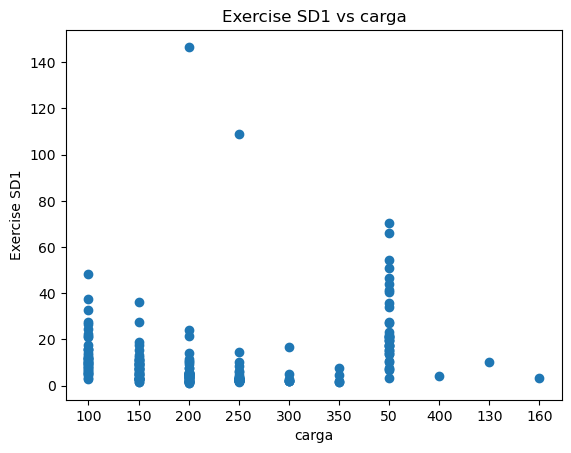

In [10]:
x_column = 'carga'
y_column = 'Exercise SD1'

plt.plot(df_all_2[x_column], df_all_2[y_column], marker='o',linestyle='')

plt.xlabel(x_column)  
plt.ylabel(y_column)  
plt.title(f'{y_column} vs {x_column}')

plt.show()

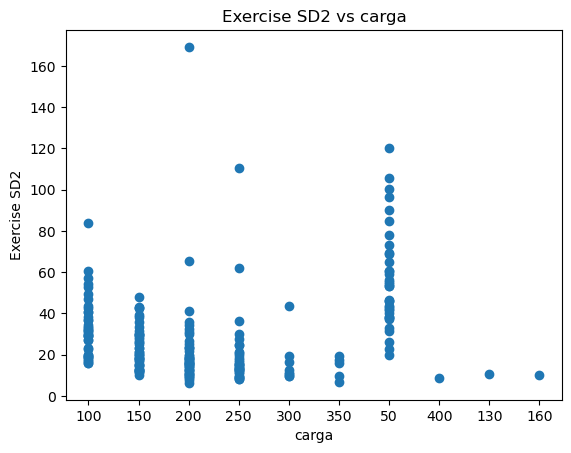

In [11]:
x_column = 'carga'
y_column = 'Exercise SD2'

plt.plot(df_all_2[x_column], df_all_2[y_column], marker='o',linestyle='')

plt.xlabel(x_column)  
plt.ylabel(y_column)  
plt.title(f'{y_column} vs {x_column}')

plt.show()

## Active data

In [27]:
df_active.head()

,Filename,Rest Mean,Rest Std,Rest SD1,Rest SD2,Exercise Mean,Exercise Std,Exercise SD1,Exercise SD2,Recovery Mean,Recovery Std,Recovery SD1,Recovery SD2
0,VPS50W.txt,970.106796,93.833521,67.378896,113.794735,798.254335,68.725382,46.736387,85.000683,957.920128,86.876377,57.678222,108.686750
1,VPS100W.txt,811.615385,77.478406,36.154846,103.436815,621.000000,23.269507,8.218215,31.891050,782.152231,76.605393,29.903111,103.768439
2,VPS150Wtts.txt,861.768116,87.234341,46.305357,114.346792,577.589595,21.757358,4.904690,30.214064,875.413994,77.813622,41.920159,101.487171
3,VPS200W.txt,882.055882,70.479199,40.918276,90.800665,550.338828,19.052093,4.586678,26.553690,983.215686,107.617693,64.846452,137.846818
4,VPS250W.txt,803.573727,70.201724,28.918383,94.998882,423.642553,21.307273,2.139987,30.067643,699.766900,61.394492,17.973696,84.985313


In [28]:
df_active_dropped = df_active.drop(df_active.columns[0], axis=1)
df_active_dropped.head()

,Rest Mean,Rest Std,Rest SD1,Rest SD2,Exercise Mean,Exercise Std,Exercise SD1,Exercise SD2,Recovery Mean,Recovery Std,Recovery SD1,Recovery SD2
0,970.106796,93.833521,67.378896,113.794735,798.254335,68.725382,46.736387,85.000683,957.920128,86.876377,57.678222,108.686750
1,811.615385,77.478406,36.154846,103.436815,621.000000,23.269507,8.218215,31.891050,782.152231,76.605393,29.903111,103.768439
2,861.768116,87.234341,46.305357,114.346792,577.589595,21.757358,4.904690,30.214064,875.413994,77.813622,41.920159,101.487171
3,882.055882,70.479199,40.918276,90.800665,550.338828,19.052093,4.586678,26.553690,983.215686,107.617693,64.846452,137.846818
4,803.573727,70.201724,28.918383,94.998882,423.642553,21.307273,2.139987,30.067643,699.766900,61.394492,17.973696,84.985313


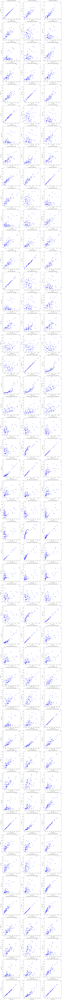

In [29]:
PLOTS(df_active_dropped)

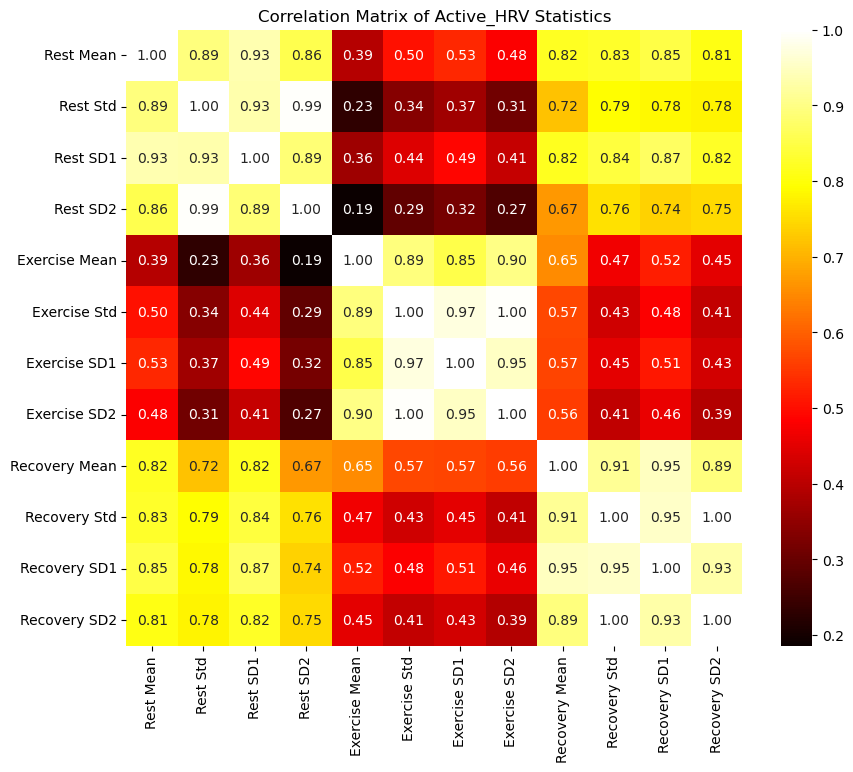

In [30]:
active_correlation_matrix = df_active_dropped.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(active_correlation_matrix, annot=True, fmt=".2f", cmap='hot', square=True, cbar=True)
plt.title('Correlation Matrix of Active_HRV Statistics')
plt.show()

In [12]:
Active_filename = "Active.csv"  
df_active_2 = pd.read_csv(Active_filename)
df_active_2 = df_active_2[df_active_2['Filename'] != 'CAMV100W.txt']
df_active_2['carga'] = df_active_2['Filename'].str.extract(r'(\d+)')


cols = df_active_2.columns.tolist()  # Get a list of column names
cols.insert(1, cols.pop(cols.index('carga')))  # Move 'carga' to the second position
# Apply the new order
df_active_2 = df_active_2[cols]
df_active_2.head()

,Filename,carga,Rest Mean,Rest Std,Rest SD1,Rest SD2,Exercise Mean,Exercise Std,Exercise SD1,Exercise SD2,Recovery Mean,Recovery Std,Recovery SD1,Recovery SD2
0,VPS50W.txt,50,970.106796,93.833521,67.378896,113.794735,798.254335,68.725382,46.736387,85.000683,957.920128,86.876377,57.678222,108.686750
1,VPS100W.txt,100,811.615385,77.478406,36.154846,103.436815,621.000000,23.269507,8.218215,31.891050,782.152231,76.605393,29.903111,103.768439
2,VPS150Wtts.txt,150,861.768116,87.234341,46.305357,114.346792,577.589595,21.757358,4.904690,30.214064,875.413994,77.813622,41.920159,101.487171
3,VPS200W.txt,200,882.055882,70.479199,40.918276,90.800665,550.338828,19.052093,4.586678,26.553690,983.215686,107.617693,64.846452,137.846818
4,VPS250W.txt,250,803.573727,70.201724,28.918383,94.998882,423.642553,21.307273,2.139987,30.067643,699.766900,61.394492,17.973696,84.985313


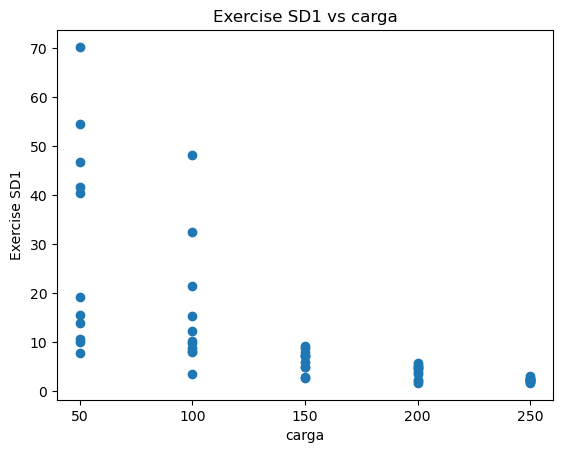

In [13]:
x_column = 'carga'
y_column = 'Exercise SD1'

plt.plot(df_active_2[x_column], df_active_2[y_column], marker='o',linestyle='')

plt.xlabel(x_column)  
plt.ylabel(y_column)  
plt.title(f'{y_column} vs {x_column}')

plt.show()

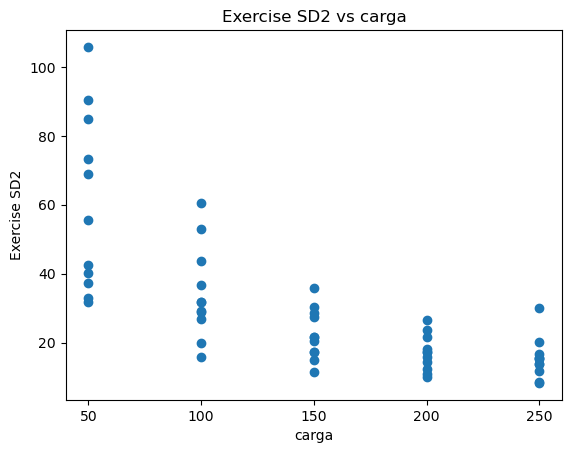

In [14]:
x_column = 'carga'
y_column = 'Exercise SD2'

plt.plot(df_active_2[x_column], df_active_2[y_column], marker='o',linestyle='')

plt.xlabel(x_column)  
plt.ylabel(y_column)  
plt.title(f'{y_column} vs {x_column}')

plt.show()

## Lazy data

In [31]:
df_lazy.head()

,Filename,Rest Mean,Rest Std,Rest SD1,Rest SD2,Exercise Mean,Exercise Std,Exercise SD1,Exercise SD2,Recovery Mean,Recovery Std,Recovery SD1,Recovery SD2
0,YARV50Wtts.txt,708.306604,60.228342,25.742175,81.277542,636.040340,35.401915,19.918104,45.938042,718.397129,65.380192,29.111174,87.734538
1,YARV100W.txt,648.653061,44.909784,15.063540,61.640560,543.876838,14.559131,7.604884,19.149406,690.960465,48.803506,22.797017,65.109631
2,YARV150W.txt,676.725000,38.940623,13.334150,53.477826,467.123924,10.583906,2.897829,14.687864,627.213508,28.871403,11.300433,39.279256
3,YARV200W.txt,607.449393,30.549099,10.815294,41.822764,387.621447,6.818436,1.357267,9.541790,555.467290,21.632840,6.649463,29.851814
4,CAMV50W.txt,643.359140,65.168186,25.835583,88.476684,588.374257,40.387976,21.187256,53.100795,631.640000,59.831015,28.331670,79.685788


In [32]:
df_lazy_dropped = df_lazy.drop(df_lazy.columns[0], axis=1)
df_lazy_dropped.head()

,Rest Mean,Rest Std,Rest SD1,Rest SD2,Exercise Mean,Exercise Std,Exercise SD1,Exercise SD2,Recovery Mean,Recovery Std,Recovery SD1,Recovery SD2
0,708.306604,60.228342,25.742175,81.277542,636.040340,35.401915,19.918104,45.938042,718.397129,65.380192,29.111174,87.734538
1,648.653061,44.909784,15.063540,61.640560,543.876838,14.559131,7.604884,19.149406,690.960465,48.803506,22.797017,65.109631
2,676.725000,38.940623,13.334150,53.477826,467.123924,10.583906,2.897829,14.687864,627.213508,28.871403,11.300433,39.279256
3,607.449393,30.549099,10.815294,41.822764,387.621447,6.818436,1.357267,9.541790,555.467290,21.632840,6.649463,29.851814
4,643.359140,65.168186,25.835583,88.476684,588.374257,40.387976,21.187256,53.100795,631.640000,59.831015,28.331670,79.685788


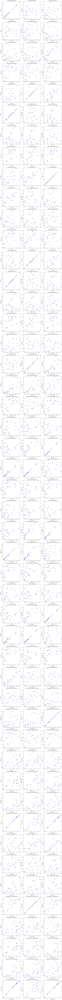

In [33]:
PLOTS(df_lazy_dropped)

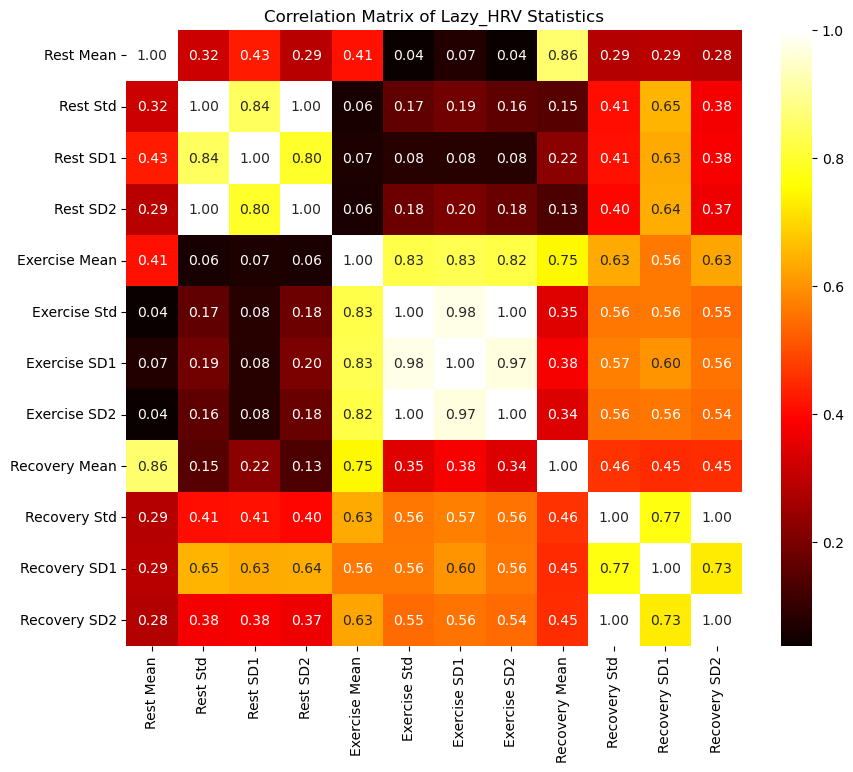

In [34]:
lazy_correlation_matrix = df_lazy_dropped.corr()
plt.figure(figsize=(10, 8)) 
sns.heatmap(lazy_correlation_matrix, annot=True, fmt=".2f", cmap='hot', square=True, cbar=True)
plt.title('Correlation Matrix of Lazy_HRV Statistics')
plt.show()

In [15]:
Lazy_filename = "Lazy.csv"  
df_lazy_2 = pd.read_csv(Lazy_filename)
df_lazy_2 = df_lazy_2[df_lazy_2['Filename'] != 'CAMV100W.txt']
df_lazy_2['carga'] = df_lazy_2['Filename'].str.extract(r'(\d+)')


cols = df_lazy_2.columns.tolist()  # Get a list of column names
cols.insert(1, cols.pop(cols.index('carga')))  # Move 'carga' to the second position
# Apply the new order
df_lazy_2 = df_lazy_2[cols]
df_lazy_2.head()

,Filename,carga,Rest Mean,Rest Std,Rest SD1,Rest SD2,Exercise Mean,Exercise Std,Exercise SD1,Exercise SD2,Recovery Mean,Recovery Std,Recovery SD1,Recovery SD2
0,YARV50Wtts.txt,50,708.306604,60.228342,25.742175,81.277542,636.040340,35.401915,19.918104,45.938042,718.397129,65.380192,29.111174,87.734538
1,YARV100W.txt,100,648.653061,44.909784,15.063540,61.640560,543.876838,14.559131,7.604884,19.149406,690.960465,48.803506,22.797017,65.109631
2,YARV150W.txt,150,676.725000,38.940623,13.334150,53.477826,467.123924,10.583906,2.897829,14.687864,627.213508,28.871403,11.300433,39.279256
3,YARV200W.txt,200,607.449393,30.549099,10.815294,41.822764,387.621447,6.818436,1.357267,9.541790,555.467290,21.632840,6.649463,29.851814
4,CAMV50W.txt,50,643.359140,65.168186,25.835583,88.476684,588.374257,40.387976,21.187256,53.100795,631.640000,59.831015,28.331670,79.685788


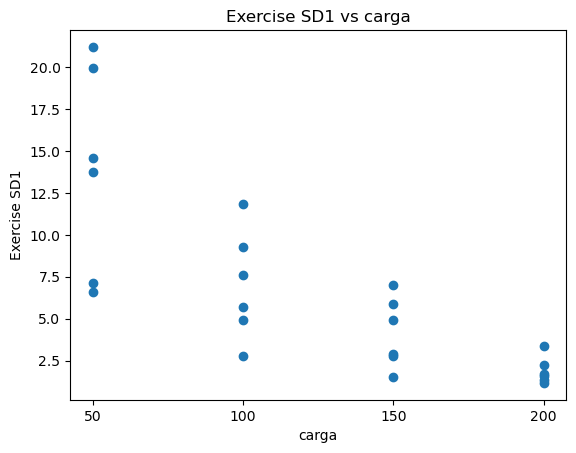

In [16]:
x_column = 'carga'
y_column = 'Exercise SD1'

plt.plot(df_lazy_2[x_column], df_lazy_2[y_column], marker='o',linestyle='')

plt.xlabel(x_column)  
plt.ylabel(y_column)  
plt.title(f'{y_column} vs {x_column}')

plt.show()

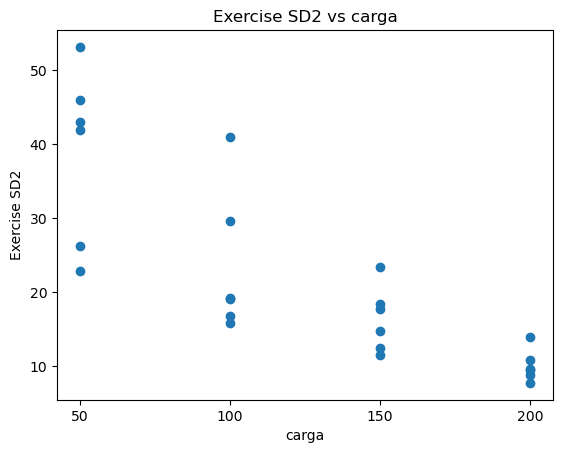

In [17]:
x_column = 'carga'
y_column = 'Exercise SD2'

plt.plot(df_lazy_2[x_column], df_lazy_2[y_column], marker='o',linestyle='')

plt.xlabel(x_column)  
plt.ylabel(y_column)  
plt.title(f'{y_column} vs {x_column}')

plt.show()